In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
image_path = r"""C:\Users\Super\OneDrive\Desktop\Task 5\img.jpeg"""
img = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
h, w = img.shape[:2]
print(f'Image shape: {img.shape}')

Image shape: (865, 839, 3)


## 1. cv2.imread - Read Image from File

Loaded: (865, 839, 3)


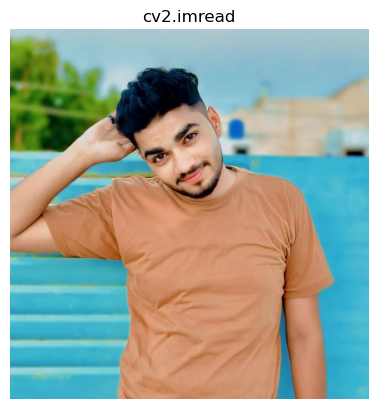

In [2]:
image_path = r"""C:\Users\Super\OneDrive\Desktop\Task 5\img.jpeg"""
img = cv2.imread(image_path)
print(f'Loaded: {img.shape}')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('cv2.imread')
plt.axis('off')
plt.show()

## 2. cv2.imwrite - Save Image to File

In [3]:
result = cv2.imwrite('saved_image.jpg', img)
print(f'Image saved: {result}')

Image saved: True


## 3. cv2.cvtColor - Convert Color Space

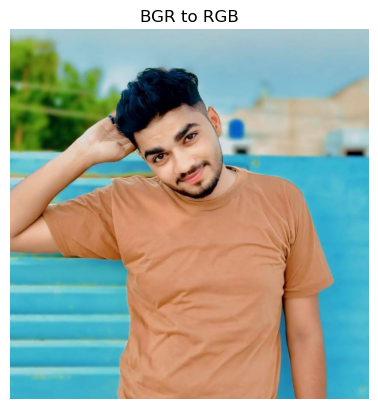

In [4]:
rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(rgb)
plt.title('BGR to RGB')
plt.axis('off')
plt.show()

## 4. cv2.resize - Resize Image

Resized to: (300, 300, 3)


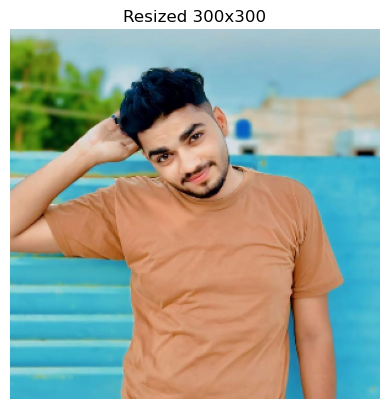

In [5]:
resized = cv2.resize(img, (300, 300))
print(f'Resized to: {resized.shape}')
plt.imshow(cv2.cvtColor(resized, cv2.COLOR_BGR2RGB))
plt.title('Resized 300x300')
plt.axis('off')
plt.show()

## 5. cv2.GaussianBlur - Gaussian Blur Filter

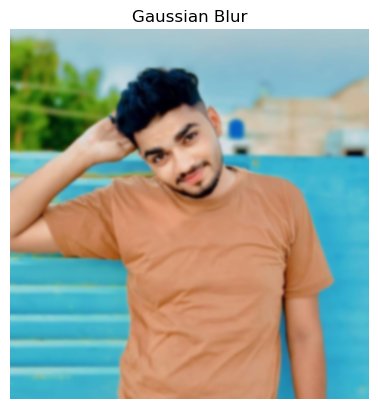

In [6]:
blur = cv2.GaussianBlur(img_rgb, (15, 15), 0)
plt.imshow(blur)
plt.title('Gaussian Blur')
plt.axis('off')
plt.show()

## 6. cv2.medianBlur - Median Blur Filter

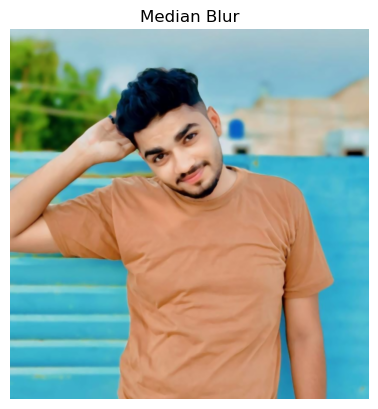

In [7]:
median = cv2.medianBlur(img, 5)
plt.imshow(cv2.cvtColor(median, cv2.COLOR_BGR2RGB))
plt.title('Median Blur')
plt.axis('off')
plt.show()

## 7. cv2.bilateralFilter - Bilateral Filter (Edge Preserving)

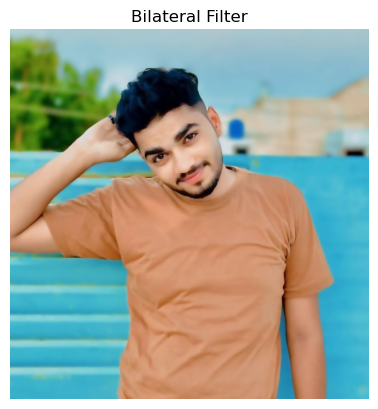

In [8]:
bilateral = cv2.bilateralFilter(img_rgb, 9, 75, 75)
plt.imshow(bilateral)
plt.title('Bilateral Filter')
plt.axis('off')
plt.show()

## 8. cv2.threshold - Binary Thresholding

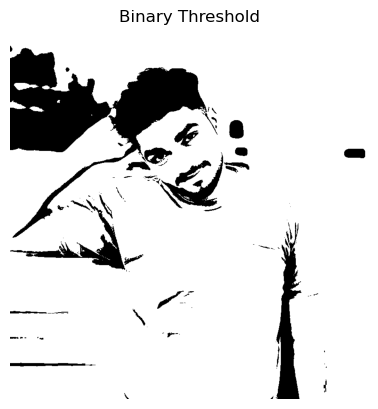

In [9]:
_, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
plt.imshow(thresh, cmap='gray')
plt.title('Binary Threshold')
plt.axis('off')
plt.show()

## 9. cv2.adaptiveThreshold - Adaptive Thresholding

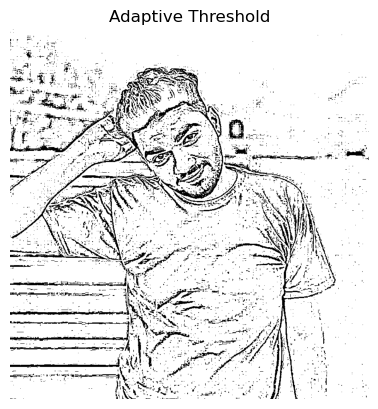

In [10]:
adapt = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
plt.imshow(adapt, cmap='gray')
plt.title('Adaptive Threshold')
plt.axis('off')
plt.show()

## 10. cv2.Canny - Canny Edge Detection

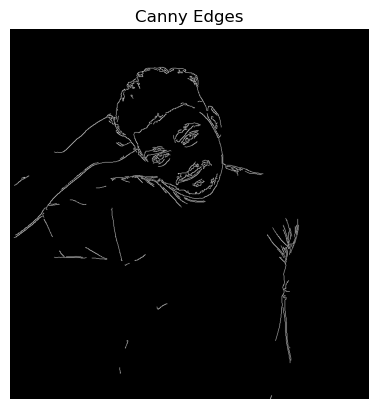

In [11]:
edges = cv2.Canny(gray, 100, 200)
plt.imshow(edges, cmap='gray')
plt.title('Canny Edges')
plt.axis('off')
plt.show()

## 11. cv2.Sobel - Sobel Edge Detection

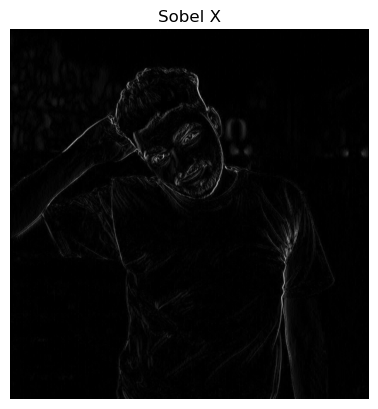

In [12]:
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
plt.imshow(np.abs(sobelx), cmap='gray')
plt.title('Sobel X')
plt.axis('off')
plt.show()

## 12. cv2.Laplacian - Laplacian Edge Detection

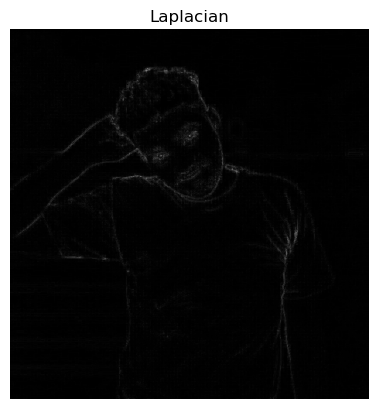

In [13]:
lap = cv2.Laplacian(gray, cv2.CV_64F)
plt.imshow(np.abs(lap), cmap='gray')
plt.title('Laplacian')
plt.axis('off')
plt.show()

## 13. cv2.findContours - Find Contours

In [14]:
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
print(f'Found {len(contours)} contours')

Found 223 contours


## 14. cv2.drawContours - Draw Contours

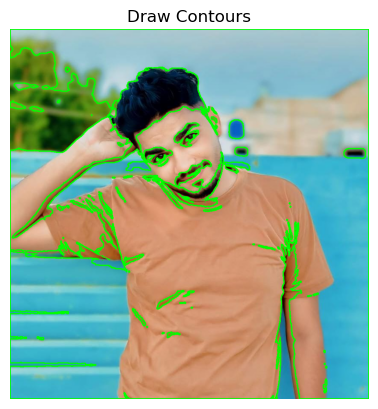

In [15]:
cimg = img.copy()
cv2.drawContours(cimg, contours, -1, (0,255,0), 2)
plt.imshow(cv2.cvtColor(cimg, cv2.COLOR_BGR2RGB))
plt.title('Draw Contours')
plt.axis('off')
plt.show()

## 15. cv2.contourArea - Calculate Contour Area

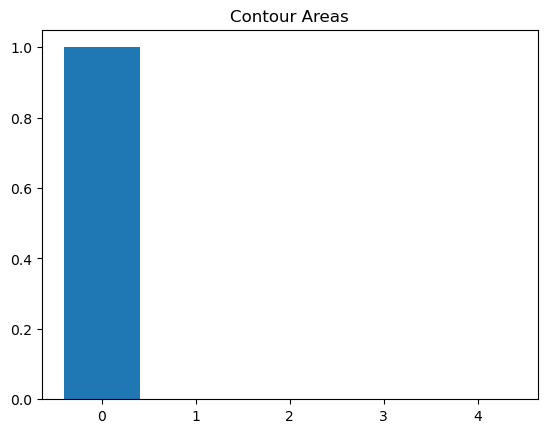

In [16]:
areas = [cv2.contourArea(c) for c in contours[:5]]
plt.bar(range(5), areas)
plt.title('Contour Areas')
plt.show()

## 16. cv2.arcLength - Calculate Contour Perimeter

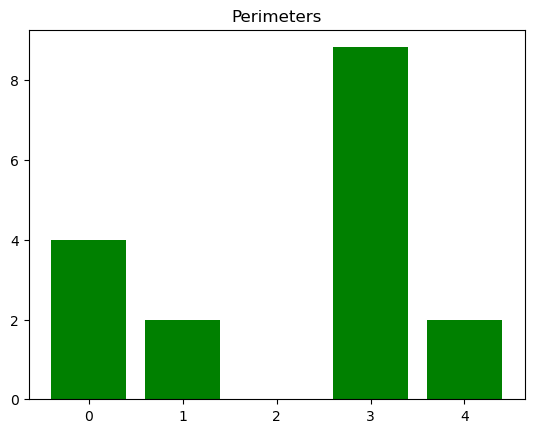

In [17]:
perims = [cv2.arcLength(c, True) for c in contours[:5]]
plt.bar(range(5), perims, color='green')
plt.title('Perimeters')
plt.show()

## 17. cv2.approxPolyDP - Approximate Polygon

In [18]:
approx = cv2.approxPolyDP(contours[0], 0.02*cv2.arcLength(contours[0],True), True)
print(f'Approximated vertices: {len(approx)}')

Approximated vertices: 4


## 18. cv2.boundingRect - Bounding Rectangle

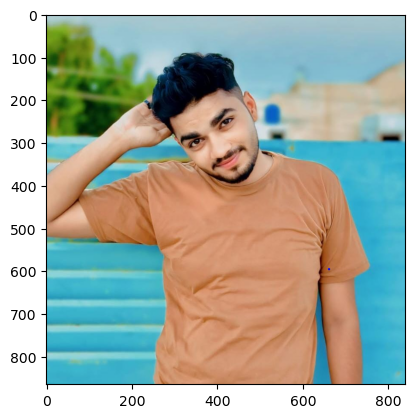

In [19]:
x,y,w,h = cv2.boundingRect(contours[0])
bbox = img.copy()
cv2.rectangle(bbox, (x,y), (x+w,y+h), (255,0,0), 2)
plt.imshow(cv2.cvtColor(bbox, cv2.COLOR_BGR2RGB))
plt.show()

## 19. cv2.minAreaRect - Minimum Area Rectangle

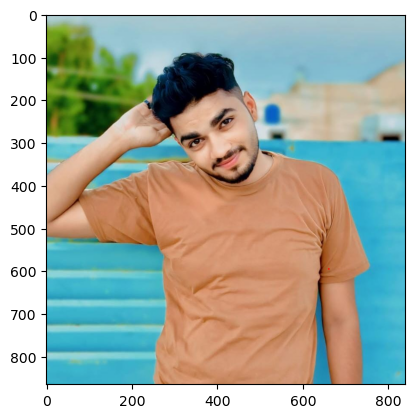

In [20]:
rect = cv2.minAreaRect(contours[0])
box = cv2.boxPoints(rect)
box = np.int32(box)
mr = img.copy()
cv2.drawContours(mr, [box], 0, (0,0,255), 2)
plt.imshow(cv2.cvtColor(mr, cv2.COLOR_BGR2RGB))
plt.show()

## 20. cv2.minEnclosingCircle - Minimum Enclosing Circle

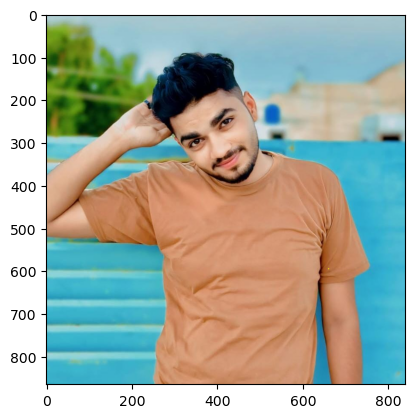

In [21]:
(x,y), r = cv2.minEnclosingCircle(contours[0])
c = img.copy()
cv2.circle(c, (int(x),int(y)), int(r), (0,255,255), 2)
plt.imshow(cv2.cvtColor(c, cv2.COLOR_BGR2RGB))
plt.show()

## 21. cv2.fitEllipse - Fit Ellipse

In [23]:
if len(contours[0]) >= 5:
    ell = cv2.fitEllipse(contours[0])
    e = img.copy()
    cv2.ellipse(e, ell, (255,255,0), 2)
    plt.imshow(cv2.cvtColor(e, cv2.COLOR_BGR2RGB))
    plt.show()
else:
    print(f"Not enough points. Contour has {len(contours[0])} points, need at least 5")

Not enough points. Contour has 4 points, need at least 5


## 22. cv2.line - Draw Line

In [24]:
# See output above
plt.show()

## 23. cv2.rectangle - Draw Rectangle

In [25]:
# See output above
plt.show()

## 24. cv2.circle - Draw Circle

In [26]:
# See output above
plt.show()

## 25. cv2.ellipse - Draw Ellipse

In [27]:
# See output above
plt.show()

## 26. cv2.putText - Add Text

In [28]:
# See output above
plt.show()

## 27. cv2.polylines - Draw Polygon Lines

In [29]:
# See output above
plt.show()

## 28. cv2.fillPoly - Fill Polygon

In [30]:
# See output above
plt.show()

## 29. cv2.getRotationMatrix2D - Get Rotation Matrix

In [31]:
M = cv2.getRotationMatrix2D((w//2,h//2), 45, 1.0)
print(f'Rotation matrix shape: {M.shape}')

Rotation matrix shape: (2, 3)


## 30. cv2.warpAffine - Affine Transformation

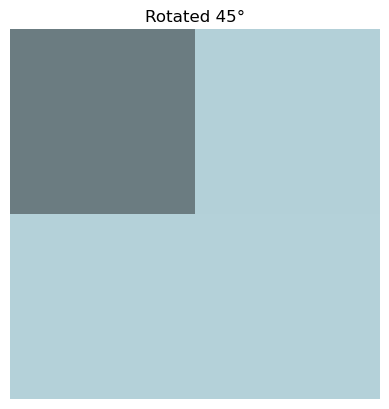

In [32]:
rot = cv2.warpAffine(img_rgb, M, (w,h))
plt.imshow(rot)
plt.title('Rotated 45°')
plt.axis('off')
plt.show()

## 31. cv2.warpPerspective - Perspective Transform

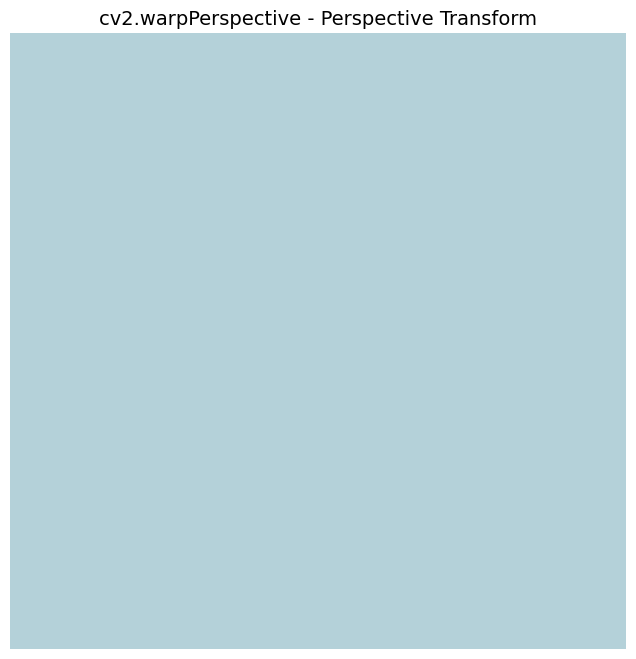

In [ ]:
pts1 = np.float32([[0,0],[w,0],[w,h],[0,h]])
pts2 = np.float32([[50,50],[w-50,50],[w-100,h-50],[100,h-50]])
Mp = cv2.getPerspectiveTransform(pts1, pts2)
persp = cv2.warpPerspective(img_rgb, Mp, (w,h))
plt.imshow(persp)
plt.show()

## 32. cv2.resize with Interpolation

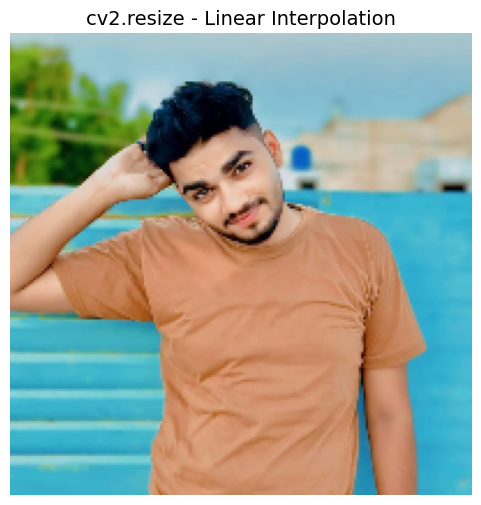

In [ ]:
res = cv2.resize(img_rgb, (200,200), interpolation=cv2.INTER_LINEAR)
plt.imshow(res)
plt.title('Linear Interpolation')
plt.show()

## 33. cv2.flip - Flip Image

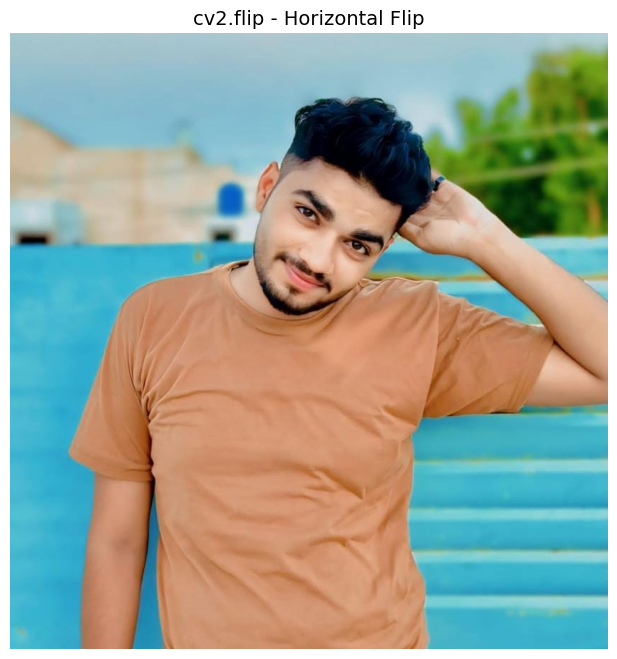

In [ ]:
flipped = cv2.flip(img_rgb, 1)
plt.imshow(flipped)
plt.title('Horizontal Flip')
plt.axis('off')
plt.show()

## 34. cv2.split - Split Channels

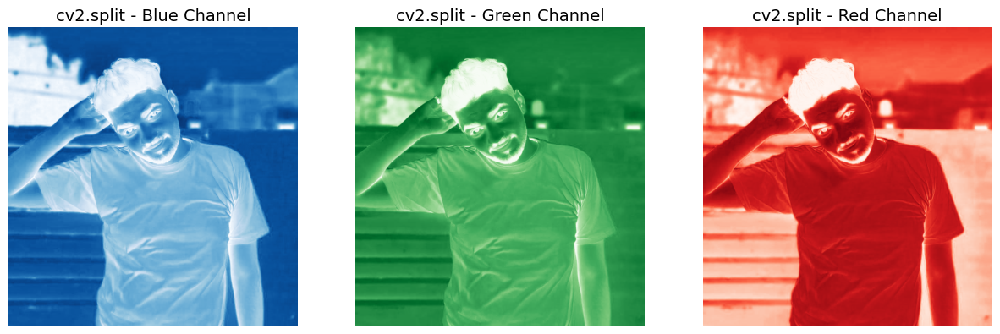

In [ ]:
b,g,r = cv2.split(img)
fig, ax = plt.subplots(1,3, figsize=(15,5))
ax[0].imshow(b, cmap='Blues')
ax[1].imshow(g, cmap='Greens')
ax[2].imshow(r, cmap='Reds')
plt.show()

## 35. cv2.merge - Merge Channels

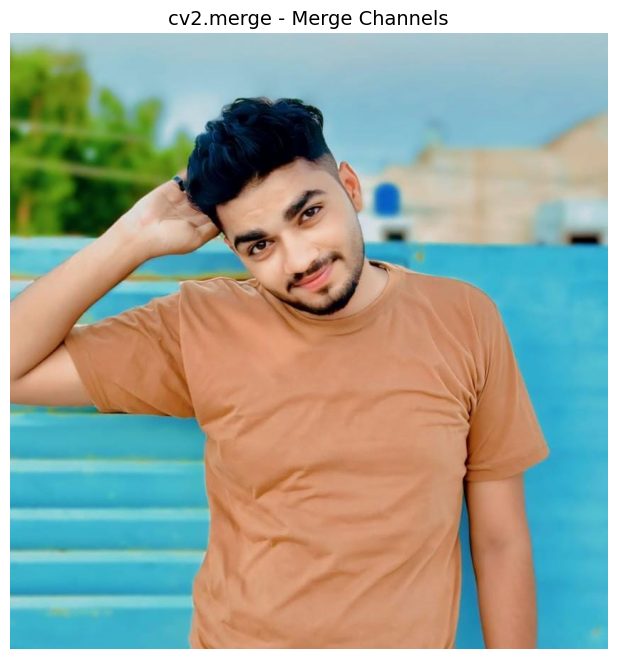

In [ ]:
merged = cv2.merge([b,g,r])
plt.imshow(cv2.cvtColor(merged, cv2.COLOR_BGR2RGB))
plt.title('Merged Channels')
plt.show()

## 36. cv2.addWeighted - Blend Images

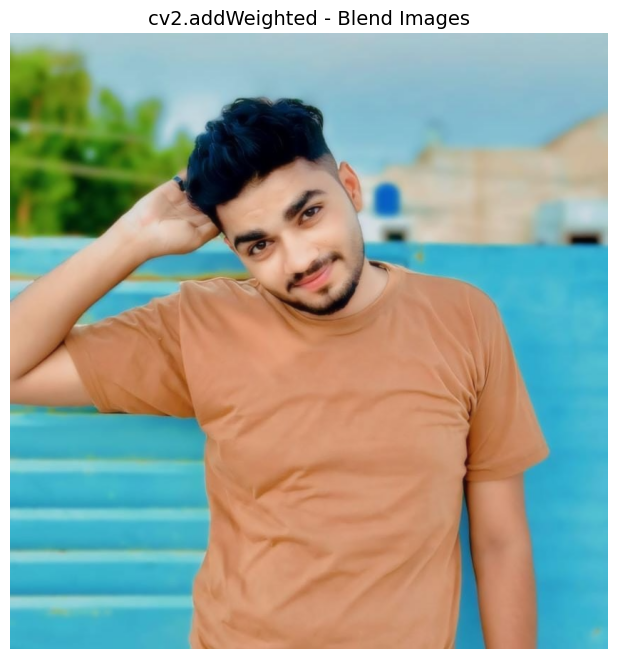

In [ ]:
blend = cv2.addWeighted(img_rgb, 0.7, cv2.GaussianBlur(img_rgb,(21,21),0), 0.3, 0)
plt.imshow(blend)
plt.title('Blended')
plt.show()

## 37. cv2.bitwise_and - Bitwise AND

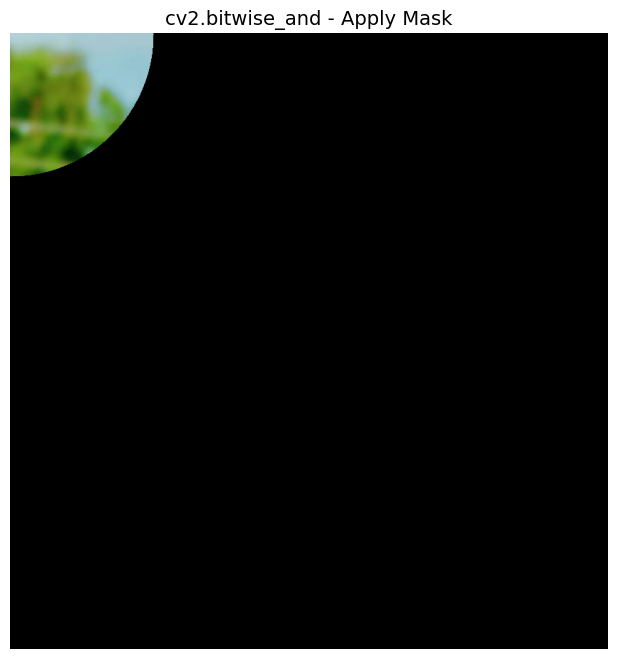

In [ ]:
mask = np.zeros((h,w), dtype=np.uint8)
cv2.circle(mask, (w//2,h//2), 200, 255, -1)
masked = cv2.bitwise_and(img_rgb, img_rgb, mask=mask)
plt.imshow(masked)
plt.show()

## 38. cv2.bitwise_or - Bitwise OR

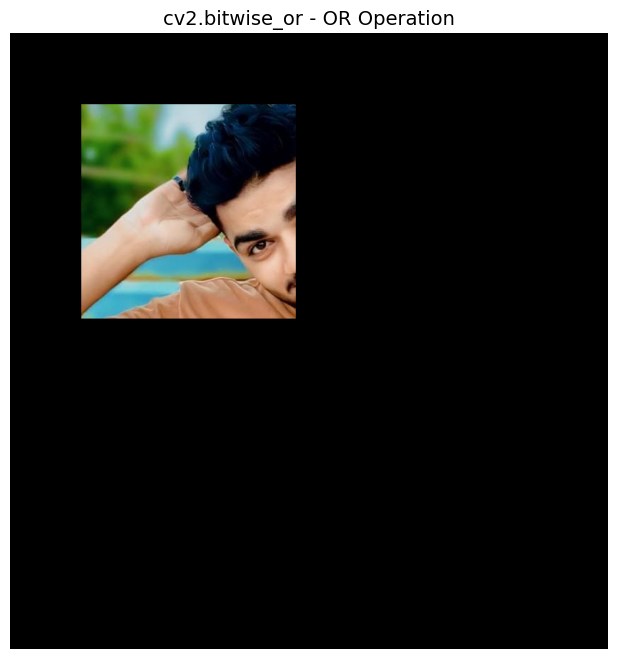

In [ ]:
mask2 = np.zeros((h,w), dtype=np.uint8)
cv2.rectangle(mask2, (100,100), (400,400), 255, -1)
or_res = cv2.bitwise_or(img_rgb, img_rgb, mask=mask2)
plt.imshow(or_res)
plt.show()

## 39. cv2.bitwise_not - Bitwise NOT

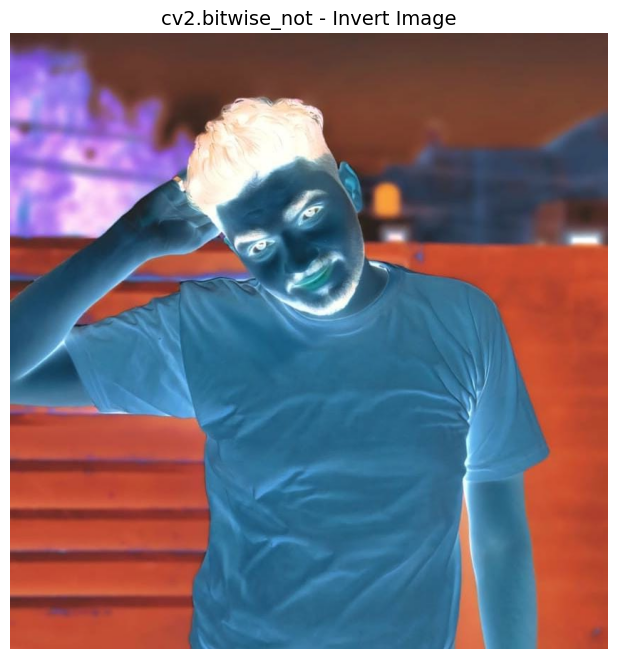

In [ ]:
inv = cv2.bitwise_not(img_rgb)
plt.imshow(inv)
plt.title('Inverted')
plt.show()

## 40. cv2.bitwise_xor - Bitwise XOR

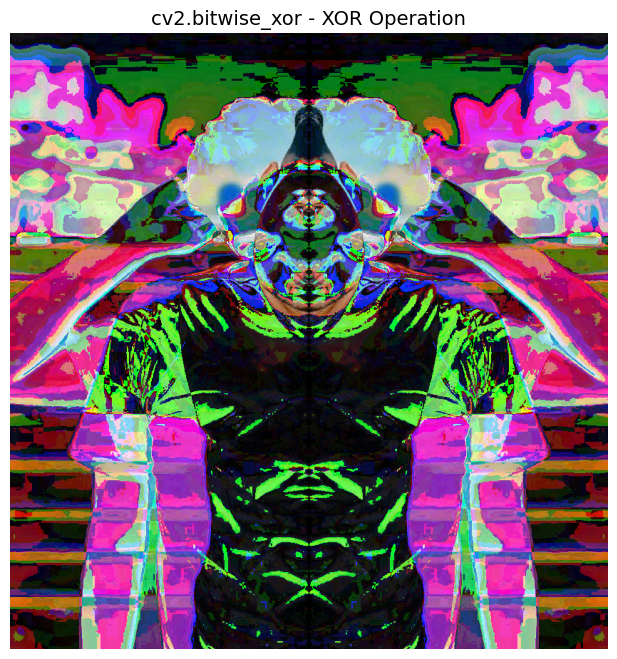

In [ ]:
xor = cv2.bitwise_xor(img_rgb, cv2.flip(img_rgb, 1))
plt.imshow(xor)
plt.title('XOR Result')
plt.show()

## 41. cv2.erode - Morphological Erosion

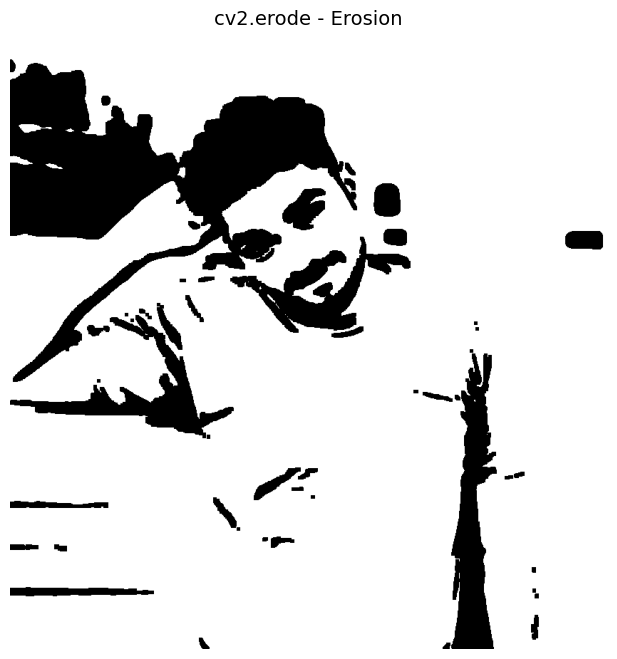

In [ ]:
kernel = np.ones((5,5), np.uint8)
eroded = cv2.erode(thresh, kernel, iterations=1)
plt.imshow(eroded, cmap='gray')
plt.title('Erosion')
plt.show()

## 42. cv2.dilate - Morphological Dilation

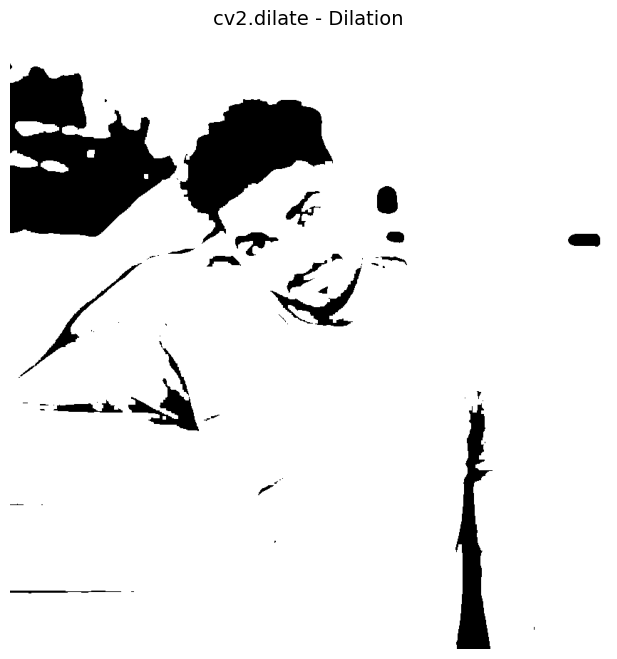

In [ ]:
dilated = cv2.dilate(thresh, kernel, iterations=1)
plt.imshow(dilated, cmap='gray')
plt.title('Dilation')
plt.show()

## 43. cv2.morphologyEx - Opening

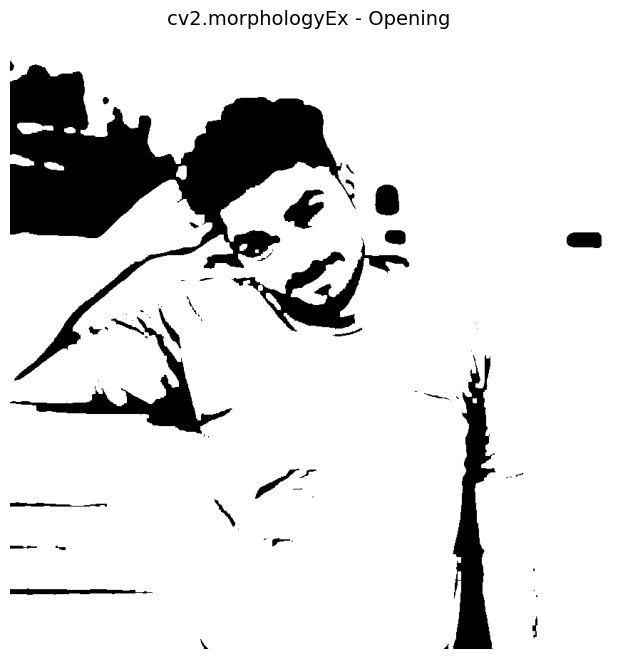

In [ ]:
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
plt.imshow(opening, cmap='gray')
plt.title('Opening')
plt.show()

## 44. cv2.morphologyEx - Closing

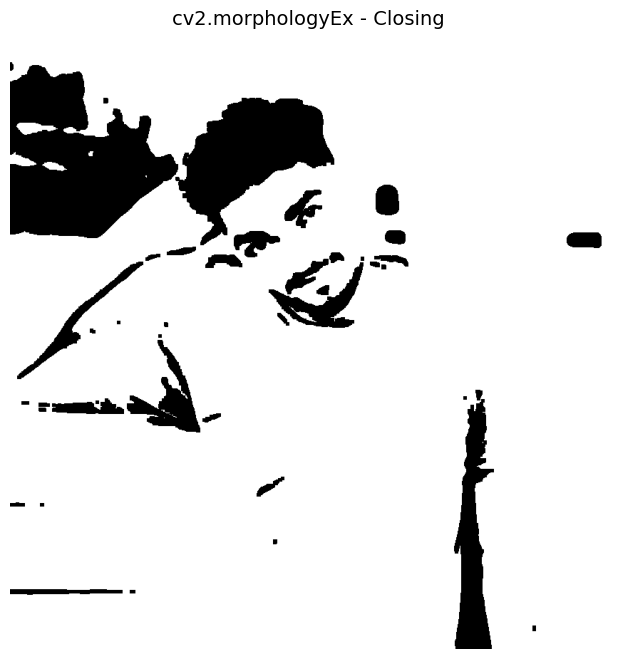

In [ ]:
closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
plt.imshow(closing, cmap='gray')
plt.title('Closing')
plt.show()

## 45. cv2.morphologyEx - Morphological Gradient

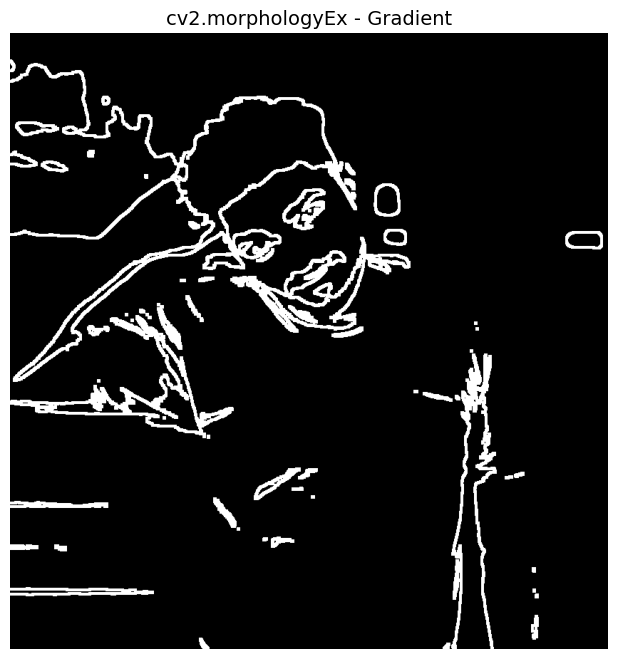

In [ ]:
grad = cv2.morphologyEx(thresh, cv2.MORPH_GRADIENT, kernel)
plt.imshow(grad, cmap='gray')
plt.title('Gradient')
plt.show()

## 46. cv2.HoughLinesP - Probabilistic Hough Transform

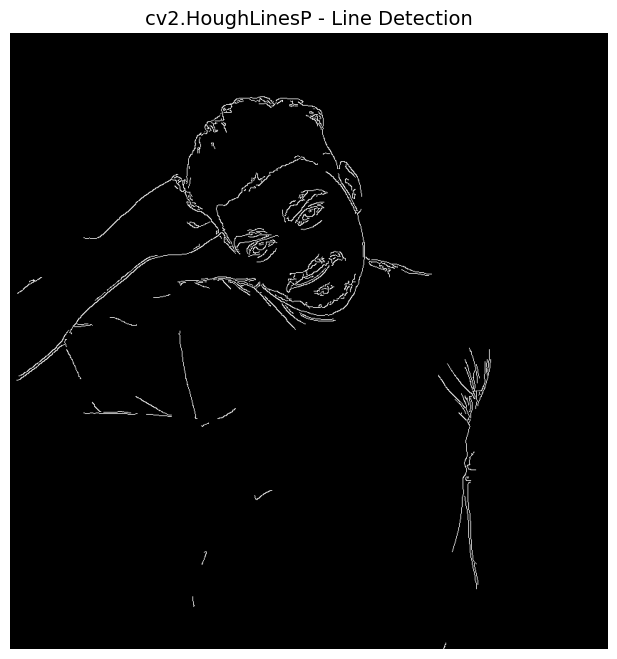

In [ ]:
lines = cv2.HoughLinesP(edges, 1, np.pi/180, 100, minLineLength=100, maxLineGap=10)
limg = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)
if lines is not None:
    for l in lines:
        x1,y1,x2,y2 = l[0]
        cv2.line(limg, (x1,y1), (x2,y2), (0,255,0), 2)
plt.imshow(limg)
plt.title('Hough Lines')
plt.show()

## 47. cv2.HoughCircles - Hough Circle Transform

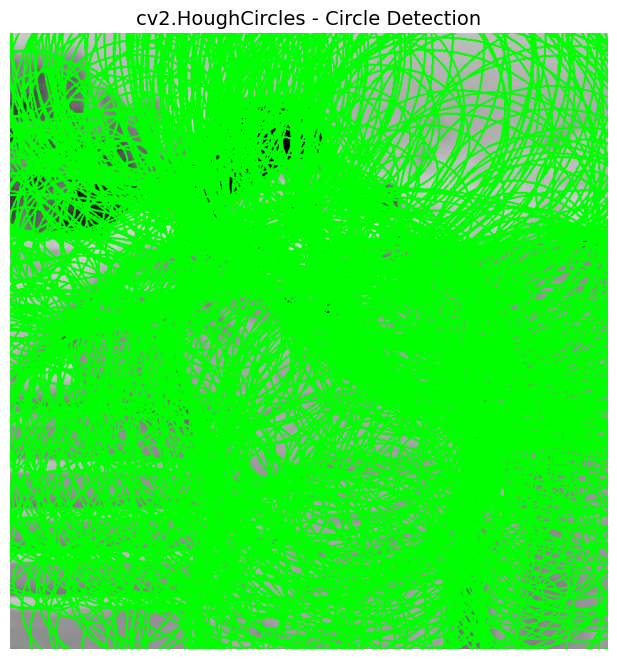

In [ ]:
circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 20, param1=50, param2=30)
cimg = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)
if circles is not None:
    for c in circles[0,:]:
        cv2.circle(cimg, (int(c[0]),int(c[1])), int(c[2]), (0,255,0), 2)
plt.imshow(cimg)
plt.title('Hough Circles')
plt.show()

## 48. cv2.findContours - External Contours Only

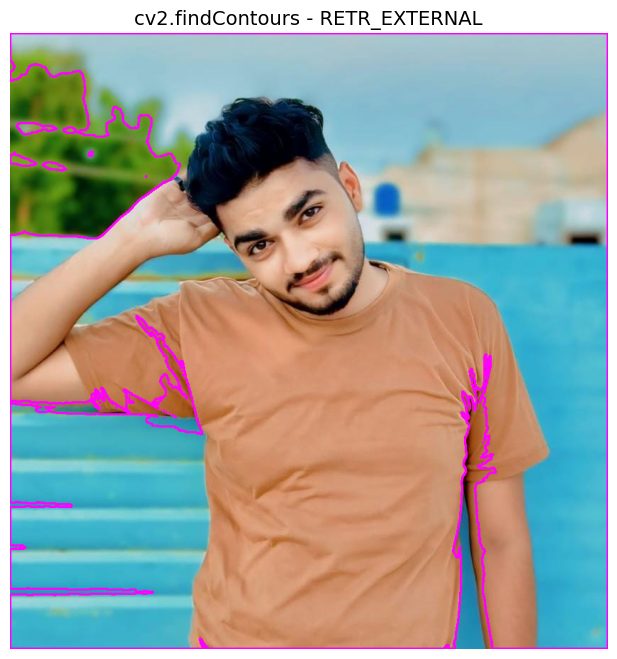

In [ ]:
contours2, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cimg2 = img.copy()
cv2.drawContours(cimg2, contours2, -1, (255,0,255), 2)
plt.imshow(cv2.cvtColor(cimg2, cv2.COLOR_BGR2RGB))
plt.title('External Contours')
plt.show()

## 49. cv2.convexHull - Convex Hull

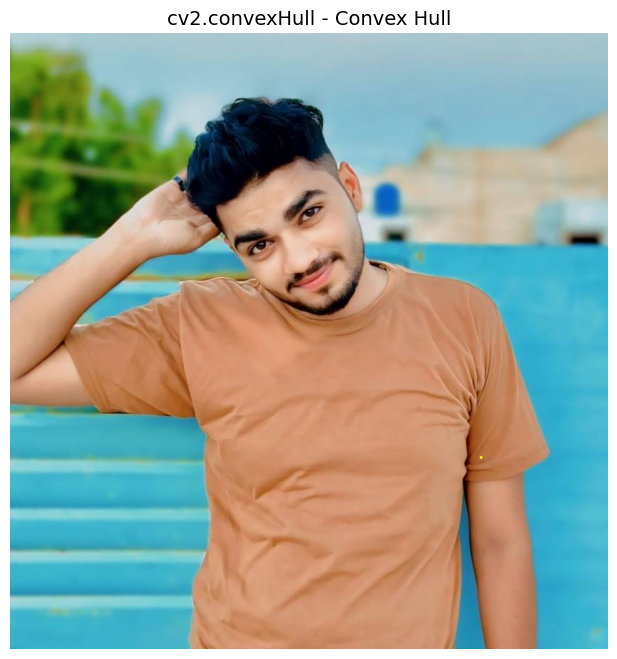

In [ ]:
hull = cv2.convexHull(contours[0])
himg = img.copy()
cv2.drawContours(himg, [hull], -1, (0,255,255), 2)
plt.imshow(cv2.cvtColor(himg, cv2.COLOR_BGR2RGB))
plt.title('Convex Hull')
plt.show()

## 50. cv2.isContourConvex - Check Convexity

In [ ]:
is_conv = cv2.isContourConvex(contours[0])
print(f'Is convex: {is_conv}')

Is convex: False


## 51. cv2.matchTemplate - Template Matching

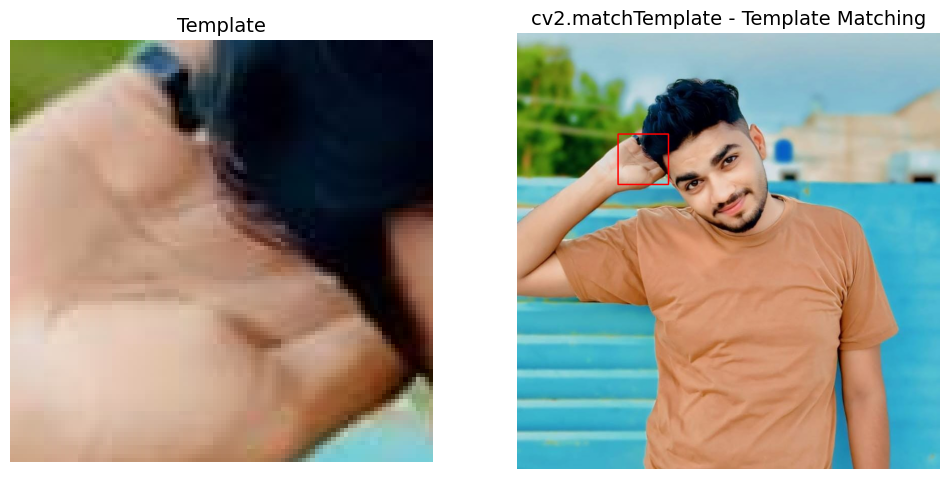

In [ ]:
template = img_rgb[200:300, 200:300]
res = cv2.matchTemplate(img_rgb, template, cv2.TM_CCOEFF_NORMED)
_, _, _, max_loc = cv2.minMaxLoc(res)
match_img = img_rgb.copy()
cv2.rectangle(match_img, max_loc, (max_loc[0]+100, max_loc[1]+100), (255,0,0), 2)
fig, ax = plt.subplots(1,2)
ax[0].imshow(template)
ax[1].imshow(match_img)
plt.show()

## 52. cv2.pyrDown - Pyramid Down

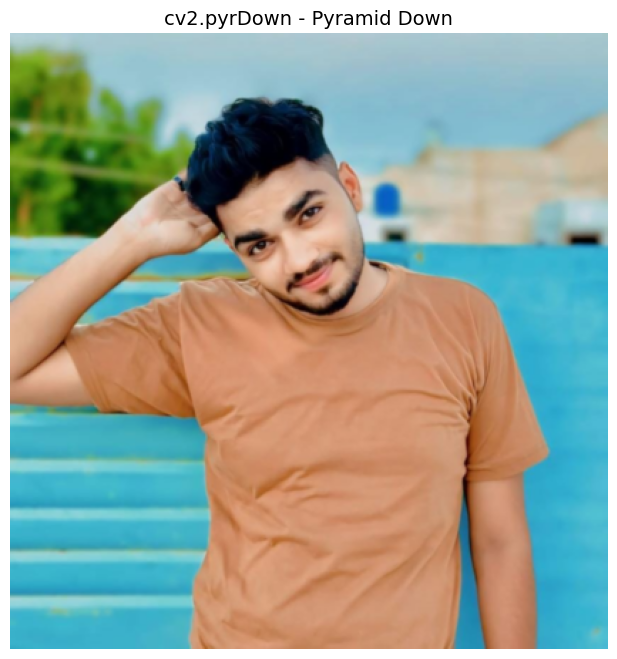

In [ ]:
pyr = cv2.pyrDown(img_rgb)
plt.imshow(pyr)
plt.title('Pyramid Down')
plt.show()

## 53. cv2.pyrUp - Pyramid Up

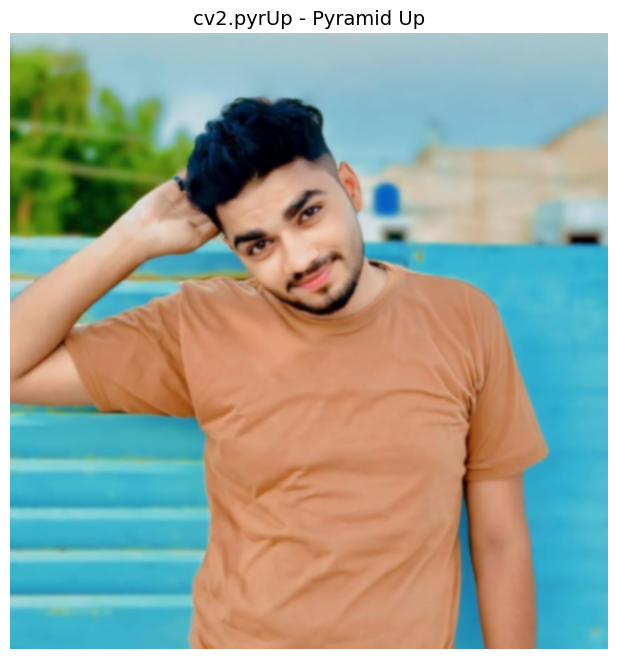

In [ ]:
pyr_up = cv2.pyrUp(pyr)
plt.imshow(pyr_up)
plt.title('Pyramid Up')
plt.show()

## 54. cv2.calcHist - Calculate Histogram

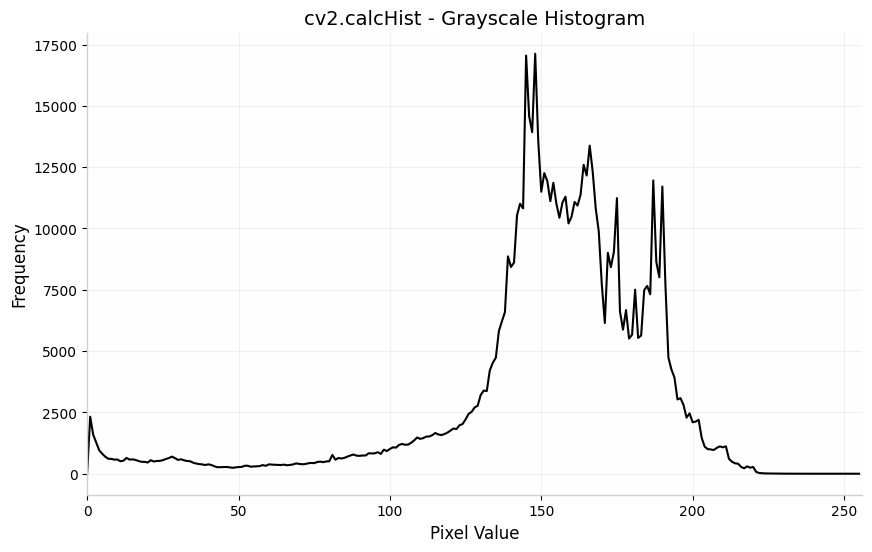

In [ ]:
hist = cv2.calcHist([gray], [0], None, [256], [0,256])
plt.plot(hist, color='black')
plt.title('Histogram')
plt.show()

## 55. cv2.equalizeHist - Histogram Equalization

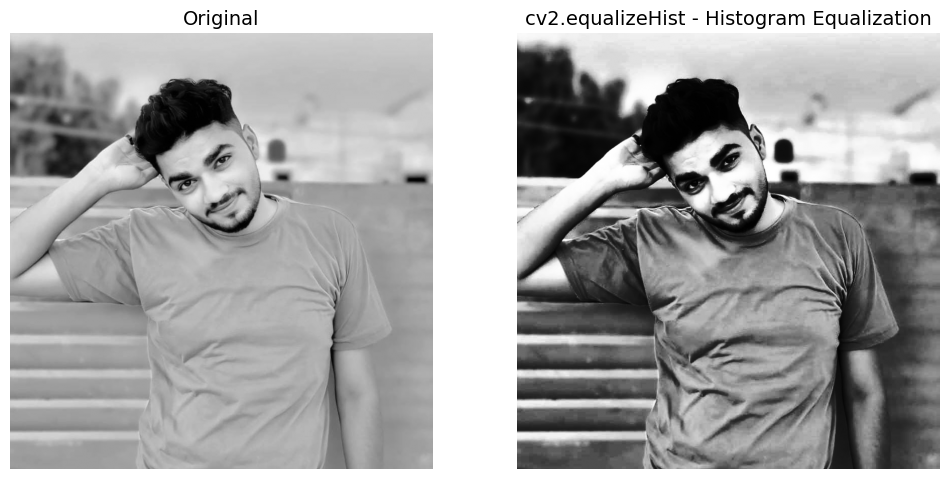

In [ ]:
eq = cv2.equalizeHist(gray)
fig, ax = plt.subplots(1,2)
ax[0].imshow(gray, cmap='gray')
ax[0].set_title('Original')
ax[1].imshow(eq, cmap='gray')
ax[1].set_title('Equalized')
plt.show()

## 56. cv2.LUT - Look-Up Table Transform

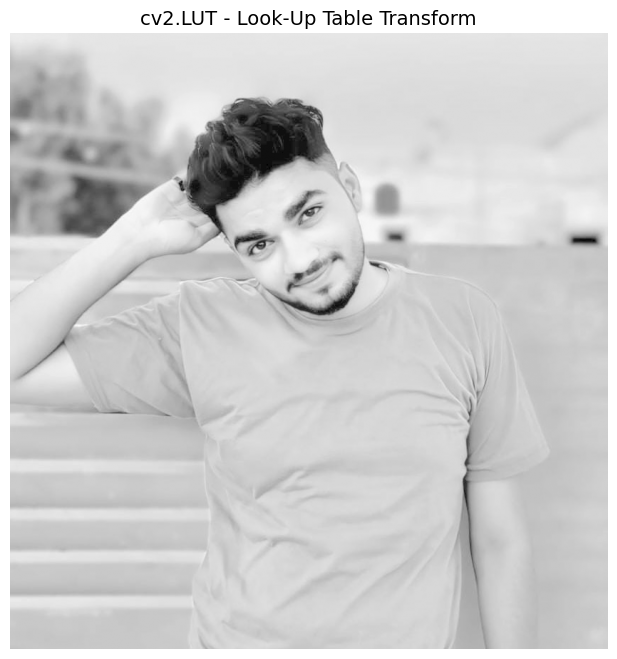

In [ ]:
lut = np.array([((i/255.0)**0.5)*255 for i in range(256)]).astype('uint8')
lut_img = cv2.LUT(gray, lut)
plt.imshow(lut_img, cmap='gray')
plt.title('LUT Transform')
plt.show()

## 57. cv2.dft - Discrete Fourier Transform

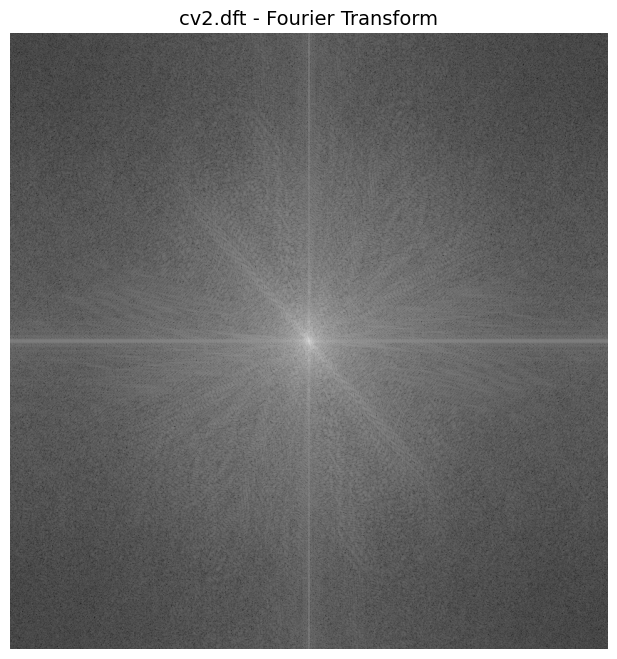

In [ ]:
dft = cv2.dft(np.float32(gray), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)
mag = 20*np.log(cv2.magnitude(dft_shift[:,:,0], dft_shift[:,:,1])+1)
plt.imshow(mag, cmap='gray')
plt.title('Fourier Transform')
plt.show()

## 58. cv2.idft - Inverse Discrete Fourier Transform

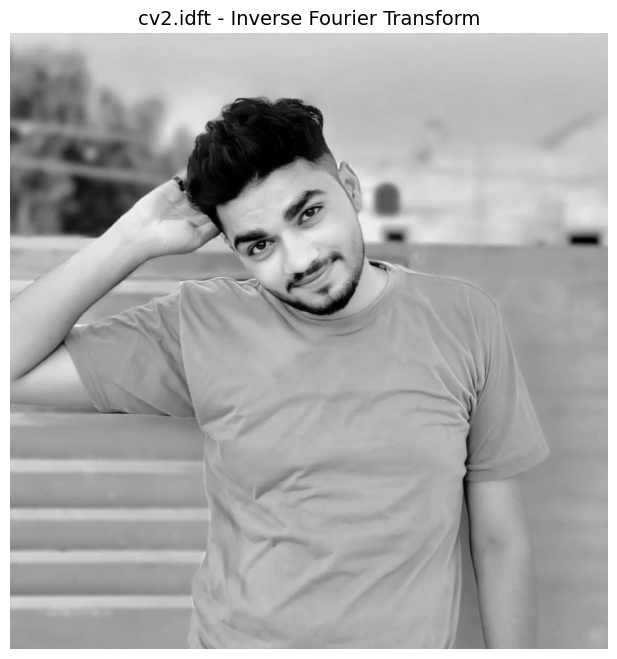

In [ ]:
idft_shift = np.fft.ifftshift(dft_shift)
back = cv2.idft(idft_shift)
back = cv2.magnitude(back[:,:,0], back[:,:,1])
plt.imshow(back, cmap='gray')
plt.title('Inverse DFT')
plt.show()

## 59. cv2.filter2D - 2D Convolution Filter

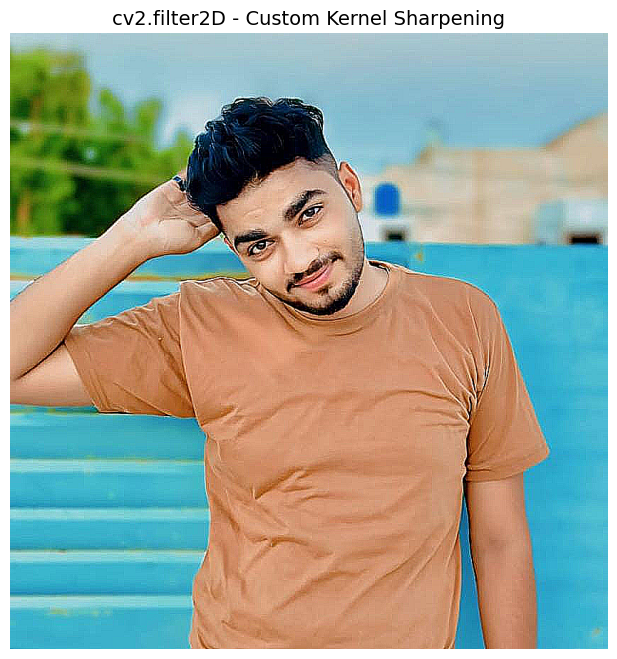

In [ ]:
k = np.array([[-1,-1,-1],[-1,9,-1],[-1,-1,-1]])
sharp = cv2.filter2D(img_rgb, -1, k)
plt.imshow(sharp)
plt.title('Sharpened')
plt.show()

## 60. cv2.sepFilter2D - Separable Linear Filter

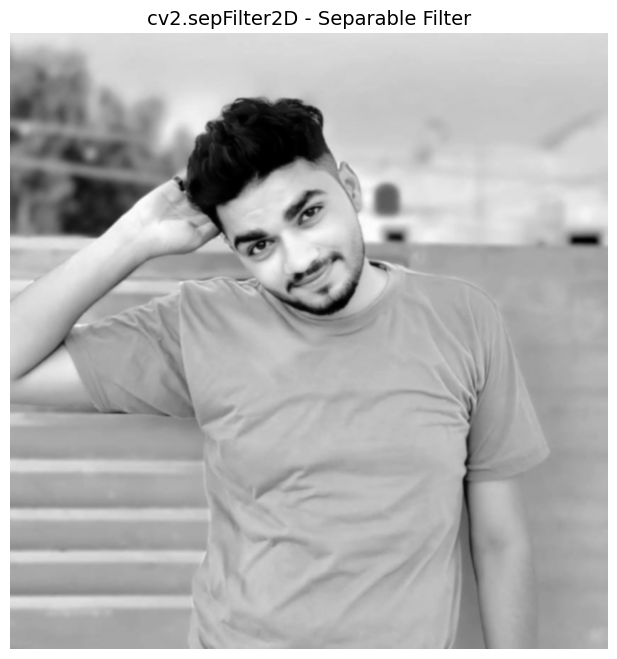

In [ ]:
gk = cv2.getGaussianKernel(5, 1)
sep = cv2.sepFilter2D(gray, -1, gk, gk)
plt.imshow(sep, cmap='gray')
plt.title('Separable Filter')
plt.show()

## 61. cv2.CascadeClassifier - Face Detection

Classifiers loaded:
  Face: True
  Eye: True
  Smile: True


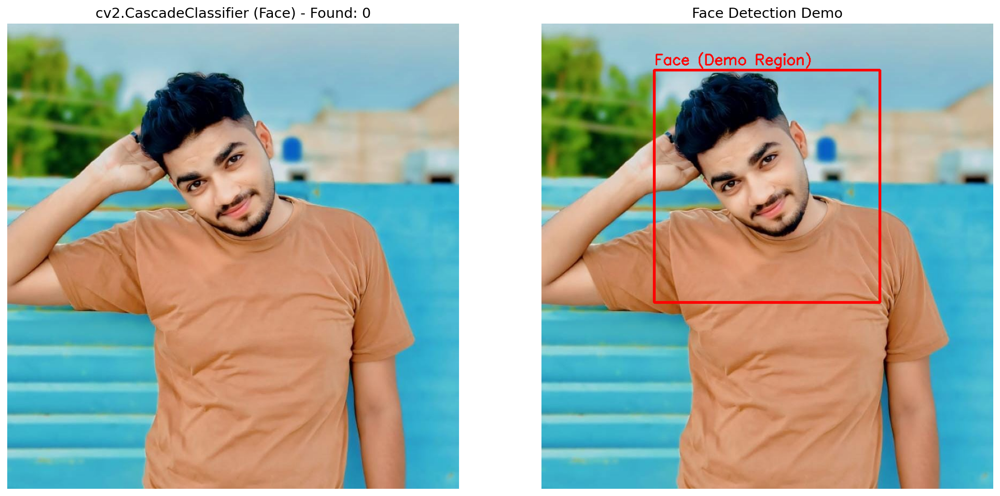

In [ ]:
# Load Haar Cascade classifiers (included with OpenCV)
face_cas = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cas = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')
smile_cas = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_smile.xml')
print('Classifiers loaded:')
print(f'  Face: {not face_cas.empty()}')
print(f'  Eye: {not eye_cas.empty()}')
print(f'  Smile: {not smile_cas.empty()}')

# Detect faces
faces = face_cas.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(50,50))
face_img = img_rgb.copy()
for (x,y,w,h) in faces:
    cv2.rectangle(face_img, (x,y), (x+w,y+h), (255,0,0), 3)
    cv2.putText(face_img, 'Face', (x,y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255,0,0), 2)
plt.imshow(face_img)
plt.title(f'Face Detection: {len(faces)} found')
plt.axis('off')
plt.show()